<a href="https://colab.research.google.com/github/bintualkassoum/netflix-rooms-project/blob/main/MMAI_5040_Group_6_Final_Project_ipynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Import packages
%matplotlib inline
import numpy as np
import pandas as pd
from zipfile import ZipFile
import pandas as pd
import matplotlib.pylab as pyl
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt

import plotly.graph_objs as go
import plotly.offline as pyo
pyo.init_notebook_mode()
from plotly import tools
from plotly.subplots import make_subplots
import plotly.offline as py
import plotly.express as px
plt.style.use('fivethirtyeight')
from warnings import filterwarnings
filterwarnings('ignore')

import pandas_profiling
from mpl_toolkits.mplot3d import Axes3D

from sklearn.cluster import KMeans, DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
import sklearn.metrics as metrics
from sklearn.metrics import silhouette_score
from sklearn.manifold import TSNE
from sklearn.tree import _tree, DecisionTreeClassifier
from sklearn.pipeline import Pipeline

from warnings import filterwarnings
filterwarnings('ignore')
# helper functions: install dmba package and import utility functions (see: https://pypi.org/project/dmba/)
import sys
# !{sys.executable} -m pip install dmba
import re
from string import punctuation
#scikit-learn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_blobs
from sklearn.decomposition import TruncatedSVD
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.tree import plot_tree # tree diagram
from sklearn.linear_model import LogisticRegression
import warnings
warnings.filterwarnings('ignore')
#pd.set_option('display.max_columns', None)

#function for removing punctuations and converting data to lowercase for consistency
def clean_punctuations_and_noise(x):
    x = str(x)                                    #set text to strings to use string and re functions
    x = x.replace('\r', ' ')                      #remove line breaks (beginning of lines)
    x = x.replace('\n', ' ')                      #remove line breaks (end of lines)
    x = re.sub(r'http://[A-Za-z0-9/.?]*', ' ', x) #remove url links
    for eachpunc in punctuation:
        if eachpunc != '-':
            x = x.replace(eachpunc, ' ')          #remove punctuations
    x = re.sub(r'\s+', ' ', x)                    #remove white spaces
    return x.lower()


In [ ]:
#Load Data Sets
from google.colab import drive
drive.mount('/content/drive')

#Import Netflix movie titles to a dataframe
titles = pd.read_csv("https://docs.google.com/spreadsheets/d/e/2PACX-1vS3kyySHnrYpwzP7JCydnmmcPFXxvalWsI09LJKZCkExJBOIw8deuF0Z88CQH5mDaHPbzwam_Uksgo5/pub?gid=106110109&single=true&output=csv",engine='python')

#Import movies from 25M
mltitles=pd.read_csv("https://docs.google.com/spreadsheets/d/e/2PACX-1vQp01FaKDb9k2lqK2gjUSrHRahDFeX4K2mewA2Z6qHjSOuzuMd7dGdy0QlJRTIRVVerF-OlUFbPHfhv/pub?gid=726852856&single=true&output=csv")

#Import tags from 25M
tags = pd.read_csv("https://docs.google.com/spreadsheets/d/e/2PACX-1vR2Kf92L1nyZclsScFd-T5OS9QCcSEYoEEK3Voe9L4hMJKy1hWAPPrU_u-fYOA7cf746RC67kv5_Fd3/pub?gid=585445436&single=true&output=csv")

#Import ratings from 25M
ratings = pd.read_csv("/content/drive/MyDrive/ratings.csv")

#Import user from 100k
user = pd.read_csv('https://docs.google.com/spreadsheets/d/e/2PACX-1vTSi0Oo-1HRVouRF57ADhl2UChmBaRJN7mLEFPd9eNnn0BDi3ED_ubl521b3d7u4QYv77vMUKxrZC7s/pub?gid=243135555&single=true&output=csv')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Theme for Visualizations
sns.set_theme(style="whitegrid")
sns.set_palette("vlag")
sns.set_palette("Reds")

sns.set

<function seaborn.rcmod.set>

In [ ]:
pd.set_option('display.max_rows', None)

In [ ]:
titles.head(1)

,Title,Genre,Tags,Languages,Series or Movie,Hidden Gem Score,Country Availability,Runtime,Director,Writer,Actors,View Rating,IMDb Score,Rotten Tomatoes Score,Metacritic Score,Awards Received,Awards Nominated For,Boxoffice,Release Date,Netflix Release Date,Production House,Netflix Link,IMDb Link,Summary,IMDb Votes,Image,Poster,TMDb Trailer,Trailer Site
0,Lets Fight Ghost,"Crime, Drama, Fantasy, Horror, Romance","Comedy Programmes,Romantic TV Comedies,Horror ...","Swedish, Spanish",Series,4.3,Thailand,< 30 minutes,Tomas Alfredson,John Ajvide Lindqvist,"Kåre Hedebrant, Per Ragnar, Lina Leandersson, ...",R,7.9,98.0,82.0,74.0,57.0,"$2,122,065",12 Dec 2008,2021-03-04,"Canal+, Sandrew Metronome",https://www.netflix.com/watch/81415947,https://www.imdb.com/title/tt1139797,A med student with a supernatural gift tries t...,205926.0,https://occ-0-4708-64.1.nflxso.net/dnm/api/v6/...,https://m.media-amazon.com/images/M/MV5BOWM4NT...,NaN,NaN


In [ ]:
mltitles.head(1)

,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy


In [ ]:
tags.head(1)

,userId,movieId,tag,timestamp
0,3,260,classic,1439472355


In [ ]:
ratings.head(1)

,userId,movieId,rating,timestamp
0,1,296,5.0,1147880044


In [ ]:
user.head(1)

,Unnamed: 0,userId,age,sex,occupation,zip_code
0,0,1,24,M,technician,85711


In [ ]:
#Split the year from the titles of the items
new = mltitles["title"].str.split("(", n = 1, expand = True)
mltitles["title"]= new[0]

#Rearranging the ", The" from the titles in mltitles
for m in mltitles["title"]:
  m = m.rstrip()
  if (m.endswith(", The")):
    x = m.split(", ")
    m = x[1]+ " " +x[0]

#Match Column Titles 
titles.rename(columns={'Title': 'title'}, inplace=True)


#Match Letters
titles['title'] = titles['title'].str.lower()
mltitles['title'] = mltitles['title'].str.lower()
titles['title'] = titles['title'].str.replace(" ","")
mltitles['title'] = mltitles['title'].str.replace(" ","")

#Merge Netflix Movies with Movielens 25M 
movies = pd.merge(mltitles, titles, on="title")
#print(movies.head(5))

#Merge Movielens 25M with Ratings
movies1 = pd.merge(movies, ratings, on="movieId")
#print(movies1.head(1))

#Merge Movies1 with User 
movies2 = pd.merge(movies1, user, on="userId")
#movies2.dropna(inplace=True)

In [ ]:
movies2.shape

(52473, 39)

In [ ]:
movies2.columns

Index(['movieId', 'title', 'genres', 'Genre', 'Tags', 'Languages',
       'Series or Movie', 'Hidden Gem Score', 'Country Availability',
       'Runtime', 'Director', 'Writer', 'Actors', 'View Rating', 'IMDb Score',
       'Rotten Tomatoes Score', 'Metacritic Score', 'Awards Received',
       'Awards Nominated For', 'Boxoffice', 'Release Date',
       'Netflix Release Date', 'Production House', 'Netflix Link', 'IMDb Link',
       'Summary', 'IMDb Votes', 'Image', 'Poster', 'TMDb Trailer',
       'Trailer Site', 'userId', 'rating', 'timestamp', 'Unnamed: 0', 'age',
       'sex', 'occupation', 'zip_code'],
      dtype='object')

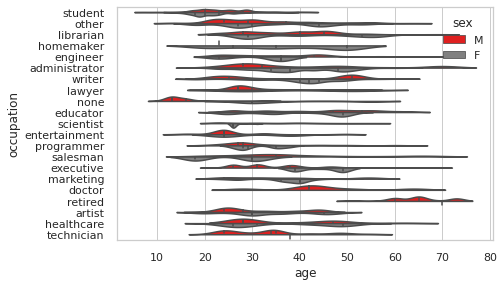

In [ ]:
#Exploratory Analysis: Pre-Processing 
men = (movies2.sex == 'M')
women = (movies2.sex == 'W')

with sns.axes_style(style=None):
    sns.set_theme(style="whitegrid")
    sns.violinplot("age", "occupation", hue="sex", data=movies2,
                   split=True, inner="quartile",
                   palette=["red", "grey"]);
plt.show()

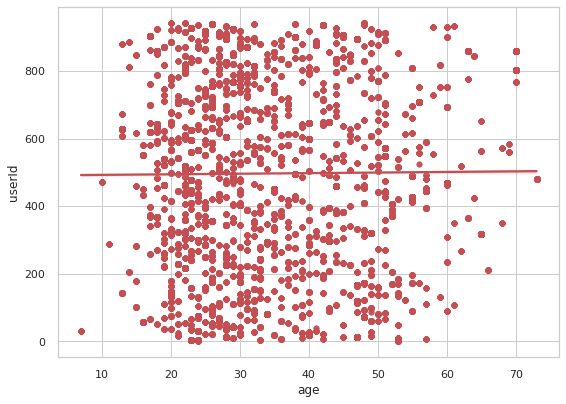

In [ ]:
#Visualize Raw Data 
plt.style.use("ggplot")
plt.figure(figsize=(8,6))
sns.set_theme(style="whitegrid")
sns.regplot(x = movies2["age"], y = movies2["userId"], color='r')
plt.show()

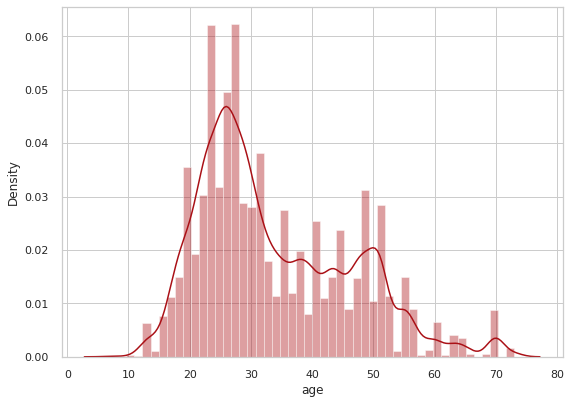

In [ ]:
#Visualize Raw Data
sns.set_theme(style="whitegrid", palette="Reds_r")
plt.figure(figsize=(8,6))
sns.distplot(movies2['age'])
plt.show()

In [ ]:
need_columns = ['userId', 'age', 'sex', 'occupation', 'zip_code', 'rating', 'genres', 'Languages']
movies3 = movies2[need_columns]
movies3.head()

,userId,age,sex,occupation,zip_code,rating,genres,Languages
0,9,29,M,student,1002,5.0,Adventure|Children|Fantasy,"English, French"
1,9,29,M,student,1002,3.0,Children|Drama,English
2,9,29,M,student,1002,3.0,Comedy|Romance,"English, Spanish"
3,9,29,M,student,1002,4.0,Drama|Thriller,Spanish
4,9,29,M,student,1002,4.0,Drama|Thriller,"English, French, Spanish, Korean"


In [ ]:
avg_rating_dict = movies3.groupby('userId')['rating'].mean().to_dict()
movies3['rating'] = movies3['userId'].map(avg_rating_dict)
movies3.dropna(inplace=True)
movies3.head()

,userId,age,sex,occupation,zip_code,rating,genres,Languages
0,9,29,M,student,1002,3.774194,Adventure|Children|Fantasy,"English, French"
1,9,29,M,student,1002,3.774194,Children|Drama,English
2,9,29,M,student,1002,3.774194,Comedy|Romance,"English, Spanish"
3,9,29,M,student,1002,3.774194,Drama|Thriller,Spanish
4,9,29,M,student,1002,3.774194,Drama|Thriller,"English, French, Spanish, Korean"


In [ ]:
movies3['genres'] = movies3['genres'].str.split('|')
movies3['Languages'] = movies3['Languages'].str.split(',')
movies3.head()

,userId,age,sex,occupation,zip_code,rating,genres,Languages
0,9,29,M,student,1002,3.774194,"[Adventure, Children, Fantasy]","[English, French]"
1,9,29,M,student,1002,3.774194,"[Children, Drama]",[English]
2,9,29,M,student,1002,3.774194,"[Comedy, Romance]","[English, Spanish]"
3,9,29,M,student,1002,3.774194,"[Drama, Thriller]",[Spanish]
4,9,29,M,student,1002,3.774194,"[Drama, Thriller]","[English, French, Spanish, Korean]"


In [ ]:
from collections import Counter
genres_list = []
for x in movies3['genres'].tolist():
  genres_list += x
res = Counter(genres_list)
print(res)
#unique_genres = [x[0] for x in res.most_common() if x[0] != '(no genres listed)']
#print(unique_genres)

Counter({'Drama': 22924, 'Action': 19811, 'Comedy': 16835, 'Thriller': 16348, 'Adventure': 13055, 'Sci-Fi': 12302, 'Crime': 10198, 'Romance': 9839, 'Fantasy': 5771, 'Mystery': 4371, 'Horror': 4168, 'IMAX': 3693, 'Children': 3238, 'War': 2961, 'Animation': 2605, 'Musical': 1612, 'Western': 1146, 'Film-Noir': 290, 'Documentary': 200, '(no genres listed)': 20})


In [ ]:
main_genres_list = res.most_common(8)
print(main_genres_list)
top8_unique_genres = [x[0] for x in main_genres_list]
print(top8_unique_genres)

[('Drama', 22924), ('Action', 19811), ('Comedy', 16835), ('Thriller', 16348), ('Adventure', 13055), ('Sci-Fi', 12302), ('Crime', 10198), ('Romance', 9839)]
['Drama', 'Action', 'Comedy', 'Thriller', 'Adventure', 'Sci-Fi', 'Crime', 'Romance']


In [ ]:
languages_list = []
for x in movies3['Languages'].tolist():
  languages_list += x
res = Counter(languages_list)
print(res)
#unique_languages = [x[0] for x in res.most_common()]
#print(unique_languages)

Counter({'English': 48319, ' French': 8177, ' Spanish': 6496, ' German': 4234, ' Russian': 2986, ' Italian': 2944, ' Arabic': 1718, ' Japanese': 1535, ' English': 1287, ' Korean': 1260, 'Japanese': 1113, ' Mandarin': 1063, ' Latin': 900, ' Hebrew': 742, ' Czech': 708, 'French': 643, ' Hindi': 640, ' Cantonese': 579, ' American Sign Language': 539, ' Ukrainian': 519, ' Swedish': 476, ' Greek': 466, 'Korean': 462, ' Portuguese': 449, ' Chinese': 432, ' Vietnamese': 415, ' Scottish Gaelic': 410, ' Thai': 349, ' Romanian': 346, ' Persian': 292, ' Pawnee': 283, 'Cantonese': 279, ' Hungarian': 265, 'Spanish': 257, ' Sioux': 251, 'Mandarin': 239, ' Klingon': 228, ' Serbian': 223, ' Turkish': 214, ' Afrikaans': 210, ' Urdu': 188, ' Hawaiian': 180, 'Yoruba': 153, ' Irish': 152, ' Esperanto': 151, 'Tamil': 139, ' Xhosa': 138, ' Dutch': 138, ' Sinhalese': 137, ' Somali': 134, ' Kurdish': 131, ' Slovak': 128, 'Indonesian': 116, 'Hindi': 112, ' Chechen': 107, ' Zulu': 106, ' Cornish': 106, ' Southe

In [ ]:
main_languages_list = res.most_common(8)
print(main_languages_list)
top8_unique_languages = [x[0] for x in main_languages_list]
print(top8_unique_languages)

[('English', 48319), (' French', 8177), (' Spanish', 6496), (' German', 4234), (' Russian', 2986), (' Italian', 2944), (' Arabic', 1718), (' Japanese', 1535)]
['English', ' French', ' Spanish', ' German', ' Russian', ' Italian', ' Arabic', ' Japanese']


In [ ]:
user_list = movies3['userId'].unique()
all_user_genres = {}
for x in top8_unique_genres:
  all_user_genres[x] = []
all_user_genres['userId'] = []
for userId in user_list:
  all_user_genres['userId'].append(userId)
  genres = movies3[movies3['userId'] == userId]['genres'].tolist()
  genres_l = []
  for x in genres:
    genres_l += x
  genres_res = Counter(genres_l)
  genres_dict = dict(genres_res.most_common())
  for key in all_user_genres:
    if key in genres_dict.keys():
      all_user_genres[key].append(genres_dict[key] / sum(genres_dict.values()))
    elif key == 'userId':
      pass
    else:
      all_user_genres[key].append(0)
all_user_genres_df = pd.DataFrame(all_user_genres)
all_user_genres_df.head()

,Drama,Action,Comedy,Thriller,Adventure,Sci-Fi,Crime,Romance,userId
0,0.152941,0.100000,0.105882,0.088235,0.100000,0.070588,0.047059,0.082353,9
1,0.164557,0.112116,0.164557,0.079566,0.084991,0.072333,0.054250,0.083183,12
2,0.153846,0.120879,0.084249,0.080586,0.095238,0.093407,0.034799,0.043956,19
3,0.121212,0.151515,0.121212,0.075758,0.121212,0.166667,0.045455,0.045455,20
4,0.228916,0.048193,0.120482,0.120482,0.048193,0.120482,0.036145,0.120482,35


In [ ]:
all_user_languages = {}
for x in top8_unique_languages:
  all_user_languages[x] = []
all_user_languages['userId'] = []
for userId in user_list:
  all_user_languages['userId'].append(userId)
  languages = movies3[movies3['userId'] == userId]['Languages'].tolist()
  languages_l = []
  for x in languages:
    languages_l += x
  languages_res = Counter(languages_l)
  languages_dict = dict(languages_res.most_common())
  for key in all_user_languages:
    if key in languages_dict.keys():
      all_user_languages[key].append(languages_dict[key] / sum(languages_dict.values()))
    elif key == 'userId':
      pass
    else:
      all_user_languages[key].append(0)
all_user_languages_df = pd.DataFrame(all_user_languages)
all_user_languages_df.head()

,English,French,Spanish,German,Russian,Italian,Arabic,Japanese,userId
0,0.608247,0.072165,0.051546,0.051546,0.010309,0.020619,0.020619,0.010309,9
1,0.534091,0.093750,0.071023,0.036932,0.025568,0.028409,0.011364,0.022727,12
2,0.400585,0.078947,0.046784,0.026316,0.038012,0.038012,0.014620,0.035088,19
3,0.638889,0.055556,0.138889,0.027778,0.027778,0.027778,0.000000,0.027778,20
4,0.566667,0.066667,0.116667,0.050000,0.016667,0.000000,0.016667,0.016667,35


In [ ]:
movies4 = movies3.drop(columns=['genres', 'Languages'])
movies4 = pd.merge(movies4, all_user_genres_df, on='userId')
movies5 = pd.merge(movies4, all_user_languages_df, on='userId')
movies5.drop_duplicates('userId', inplace=True)
movies5.reset_index(inplace=True)
movies5.head()

,index,userId,age,sex,occupation,zip_code,rating,Drama,Action,Comedy,Thriller,Adventure,Sci-Fi,Crime,Romance,English,French,Spanish,German,Russian,Italian,Arabic,Japanese
0,0,9,29,M,student,1002,3.774194,0.152941,0.100000,0.105882,0.088235,0.100000,0.070588,0.047059,0.082353,0.608247,0.072165,0.051546,0.051546,0.010309,0.020619,0.020619,0.010309
1,62,12,28,F,other,6405,3.289604,0.164557,0.112116,0.164557,0.079566,0.084991,0.072333,0.054250,0.083183,0.534091,0.093750,0.071023,0.036932,0.025568,0.028409,0.011364,0.022727
2,264,19,40,M,librarian,2138,3.420904,0.153846,0.120879,0.084249,0.080586,0.095238,0.093407,0.034799,0.043956,0.400585,0.078947,0.046784,0.026316,0.038012,0.038012,0.014620,0.035088
3,441,20,42,F,homemaker,95660,4.434783,0.121212,0.151515,0.121212,0.075758,0.121212,0.166667,0.045455,0.045455,0.638889,0.055556,0.138889,0.027778,0.027778,0.027778,0.000000,0.027778
4,464,35,20,F,homemaker,42459,3.779412,0.228916,0.048193,0.120482,0.120482,0.048193,0.120482,0.036145,0.120482,0.566667,0.066667,0.116667,0.050000,0.016667,0.000000,0.016667,0.016667


In [ ]:
x=movies5.iloc[:,[2,3]].values
print(x)

[[29 'M']
 [28 'F']
 [40 'M']
 ...
 [51 'F']
 [33 'M']
 [35 'M']]


In [ ]:
#Convert Categorical Variables into Dummies 
movies5 = pd.get_dummies(movies5, prefix=['sex', 'occupation'], columns=['sex', 'occupation'])
movies5.head(1)

,index,userId,age,zip_code,rating,Drama,Action,Comedy,Thriller,Adventure,Sci-Fi,Crime,Romance,English,French,Spanish,German,Russian,Italian,Arabic,Japanese,sex_F,sex_M,occupation_administrator,occupation_artist,occupation_doctor,occupation_educator,occupation_engineer,occupation_entertainment,occupation_executive,occupation_healthcare,occupation_homemaker,occupation_lawyer,occupation_librarian,occupation_marketing,occupation_none,occupation_other,occupation_programmer,occupation_retired,occupation_salesman,occupation_scientist,occupation_student,occupation_technician,occupation_writer
0,0,9,29,1002,3.774194,0.152941,0.1,0.105882,0.088235,0.1,0.070588,0.047059,0.082353,0.608247,0.072165,0.051546,0.051546,0.010309,0.020619,0.020619,0.010309,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


In [ ]:
#Data Pre-Processing 
movies5.drop(columns='index', inplace=True)
movies5.drop(['zip_code'], axis=1, inplace=True)

In [ ]:
#Data Pre-Processing 
movies5.head(1) 

,userId,age,rating,Drama,Action,Comedy,Thriller,Adventure,Sci-Fi,Crime,Romance,English,French,Spanish,German,Russian,Italian,Arabic,Japanese,sex_F,sex_M,occupation_administrator,occupation_artist,occupation_doctor,occupation_educator,occupation_engineer,occupation_entertainment,occupation_executive,occupation_healthcare,occupation_homemaker,occupation_lawyer,occupation_librarian,occupation_marketing,occupation_none,occupation_other,occupation_programmer,occupation_retired,occupation_salesman,occupation_scientist,occupation_student,occupation_technician,occupation_writer
0,9,29,3.774194,0.152941,0.1,0.105882,0.088235,0.1,0.070588,0.047059,0.082353,0.608247,0.072165,0.051546,0.051546,0.010309,0.020619,0.020619,0.010309,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


In [ ]:
#Data Pre-Processing - Make a Copy of Data
movies6 = movies5.copy() 

In [ ]:
movies6.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 943 entries, 0 to 942
Data columns (total 42 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   userId                    943 non-null    int64  
 1   age                       943 non-null    int64  
 2   rating                    943 non-null    float64
 3   Drama                     943 non-null    float64
 4   Action                    943 non-null    float64
 5   Comedy                    943 non-null    float64
 6   Thriller                  943 non-null    float64
 7   Adventure                 943 non-null    float64
 8   Sci-Fi                    943 non-null    float64
 9   Crime                     943 non-null    float64
 10  Romance                   943 non-null    float64
 11  English                   943 non-null    float64
 12   French                   943 non-null    float64
 13   Spanish                  943 non-null    float64
 14   German   

In [ ]:
#Data Pre-Processing - Define X Value for Clustering 
X=movies5.iloc[:,[2,3]].values 

X.shape

(943, 2)

In [ ]:
#Data Pre-Processing - Make a Copy of X for K-Means 
XC = X.copy()
XD = X.copy()

In [ ]:
#Standardize - K-Means
scaler = StandardScaler()
scaler.fit(movies5)
XC = scaler.transform(movies5)
XC = pd.DataFrame(XC, columns=movies5.columns)

In [ ]:
#K-Means - Clustering - K-Means
n_clusters = [2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,
              18,19,20,21,22,23,24,25,26,27,28,29,30] # number of clusters
clusters_inertia = [] # inertia of clusters
s_scores = [] # silhouette scores

for n in n_clusters:
    KM_est = KMeans(n_clusters=n, init='k-means++').fit(XC)
    clusters_inertia.append(KM_est.inertia_)    # data for the elbow method
    silhouette_avg = silhouette_score(XC, KM_est.labels_)
    s_scores.append(silhouette_avg) # data for the silhouette score method

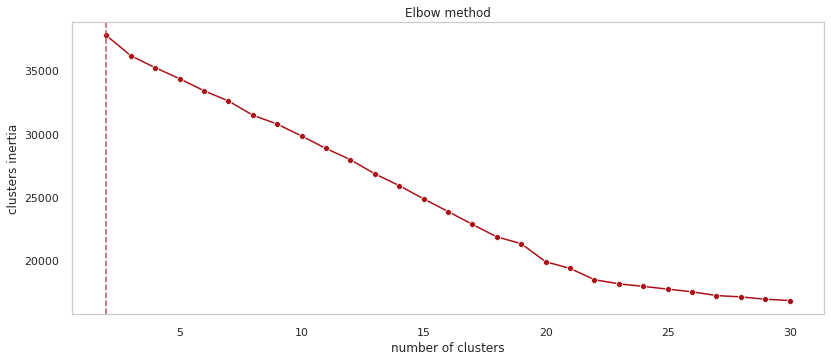

In [ ]:
#K-Means - Use Elbow to Determine Optimal Number of Clusters 
fig, ax = plt.subplots(figsize=(12,5))
ax = sns.lineplot(n_clusters, clusters_inertia,marker='o', ax=ax)
sns.set_palette("Reds_r")
ax.set_title("Elbow method")
ax.set_xlabel("number of clusters")
ax.set_ylabel("clusters inertia")
ax.axvline(2, ls="--", c="r")
plt.grid()
plt.show()

According to our results, 2 clusters appears to be optimal, however, since our dataset is large and contains numerous features, two clusters is unlikely to provide good business insights

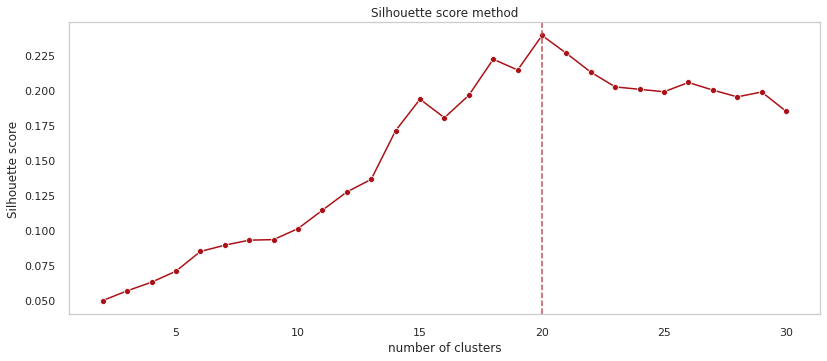

In [ ]:
#Use Silhouette to Confirm Elbow Results 
fig, ax = plt.subplots(figsize=(12,5))
ax = sns.lineplot(n_clusters, s_scores, marker='o', ax=ax)
ax.set_title("Silhouette score method")
sns.set_palette("Reds_r")
ax.set_xlabel("number of clusters")
ax.set_ylabel("Silhouette score")
ax.axvline(20, ls="--", c="r")
plt.grid()
plt.show()

We run into some trouble with our silhouette score results, which indicate a positive correlation between the silhouette score and number of clusters up until about 20. Given the context of our data, we will stick with 19 clusters, as opposed to 2 (given by the elbow method above).


In [ ]:
#K-Means - Creating a New DataFrame
KM_clusters = KMeans(n_clusters=20, init='k-means++').fit(XC) # initialise and fit K-Means model

KM_clustered = XC.copy()
KM_clustered = pd.DataFrame(KM_clustered)
KM_clustered.loc[:,'Cluster'] = KM_clusters.labels_ # append labels to points

In [ ]:
#K-Means - Cluster Sizes (Elbow)
KM_clust_sizes = KM_clustered.groupby('Cluster').size().to_frame()
KM_clust_sizes.columns = ["K Cluster Size"]
KM_clust_sizes.head()

,K Cluster Size
Cluster,
0,79
1,52
2,67
3,32
4,51


Our clusters significantly range in size, with clusters 12 and 15 only having 7 users and clusters 14 and 7 having over 100!

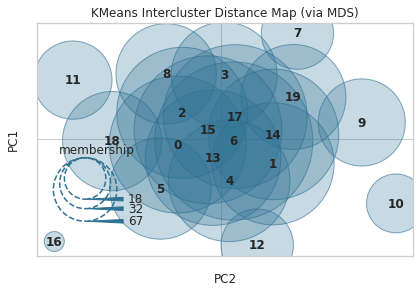

In [ ]:
#K-Means - Intercluster Distance Map
from yellowbrick.cluster import InterclusterDistance
from yellowbrick.style.palettes import PALETTES, SEQUENCES, color_palette
from yellowbrick.style import set_palette
sns.set_palette('dark')

#Instantiate the clustering model and visualizer
visualizer = InterclusterDistance(KM_clusters, color="red")
visualizer.fit(KM_clustered)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

The K-Means intercluster map tells us the relative distance of the different clusters. We can see that for most of the clusters there is substantial overlap. This indicates that there are strong similarities between features thats causing the distances to become converge. This map also indicates to use that cluster 12 and cluster 15 have significantly less users but most importantly, these users share unique similarities among one another not found in the majority of our users. 

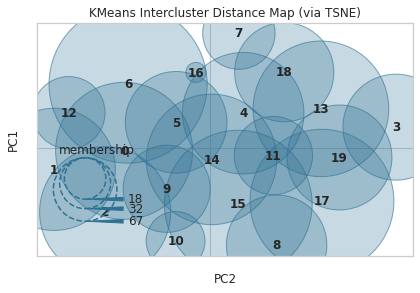

In [ ]:
#K-Means Plotting Results - Intercluster Distance Map
#Instantiate the clustering model and visualizer
visualizer = InterclusterDistance(KM_clusters,color="Reds", embedding='tsne')
visualizer.fit(KM_clustered)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

In [ ]:
KM_clustered.squeeze()

,userId,age,rating,Drama,Action,Comedy,Thriller,Adventure,Sci-Fi,Crime,Romance,English,French,Spanish,German,Russian,Italian,Arabic,Japanese,sex_F,sex_M,occupation_administrator,occupation_artist,occupation_doctor,occupation_educator,occupation_engineer,occupation_entertainment,occupation_executive,occupation_healthcare,occupation_homemaker,occupation_lawyer,occupation_librarian,occupation_marketing,occupation_none,occupation_other,occupation_programmer,occupation_retired,occupation_salesman,occupation_scientist,occupation_student,occupation_technician,occupation_writer,Cluster
0,-1.700827,-0.414562,0.138451,-0.055055,-0.495745,-0.163945,-0.387364,0.270546,-0.109282,-0.532528,0.151870,0.987584,-0.451458,-0.386255,0.357778,-0.608149,-0.350218,0.254371,-0.095544,-0.638328,0.638328,-0.302383,-0.174932,-0.086479,-0.334706,-0.276557,-0.139497,-0.187420,-0.131377,-0.086479,-0.113531,-0.239113,-0.168384,-0.098163,-0.353975,-0.274329,-0.122760,-0.113531,-0.184367,1.952236,-0.171686,-0.223856,6
1,-1.689807,-0.496621,-0.822238,0.109935,-0.263848,0.780276,-0.564998,-0.087804,-0.071058,-0.344097,0.168116,0.270179,0.067755,0.155028,-0.174915,-0.004368,-0.070343,-0.224715,0.653096,1.566593,-1.566593,-0.302383,-0.174932,-0.086479,-0.334706,-0.276557,-0.139497,-0.187420,-0.131377,-0.086479,-0.113531,-0.239113,-0.168384,-0.098163,2.825058,-0.274329,-0.122760,-0.113531,-0.184367,-0.512233,-0.171686,-0.223856,15
2,-1.664092,0.488093,-0.561939,-0.042201,-0.096116,-0.512078,-0.544096,0.156852,0.390690,-0.853805,-0.599965,-1.021384,-0.288312,-0.518621,-0.561864,0.488009,0.274631,-0.056154,1.398268,-0.638328,0.638328,-0.302383,-0.174932,-0.086479,-0.334706,-0.276557,-0.139497,-0.187420,-0.131377,-0.086479,-0.113531,4.182128,-0.168384,-0.098163,-0.353975,-0.274329,-0.122760,-0.113531,-0.184367,-0.512233,-0.171686,-0.223856,4
3,-1.660419,0.652212,1.448055,-0.505734,0.490261,0.082749,-0.643033,0.776997,1.995887,-0.574567,-0.570623,1.284015,-0.850986,2.041152,-0.508575,0.083063,-0.093023,-0.812960,0.957575,1.566593,-1.566593,-0.302383,-0.174932,-0.086479,-0.334706,-0.276557,-0.139497,-0.187420,-0.131377,11.563489,-0.113531,-0.239113,-0.168384,-0.098163,-0.353975,-0.274329,-0.122760,-0.113531,-0.184367,-0.512233,-0.171686,-0.223856,16
4,-1.605316,-1.153098,0.148796,1.024086,-1.487341,0.070998,0.273370,-0.966381,0.983936,-0.818532,0.898458,0.585323,-0.583716,1.423556,0.301413,-0.356593,-1.090940,0.049799,0.287722,1.566593,-1.566593,-0.302383,-0.174932,-0.086479,-0.334706,-0.276557,-0.139497,-0.187420,-0.131377,11.563489,-0.113531,-0.239113,-0.168384,-0.098163,-0.353975,-0.274329,-0.122760,-0.113531,-0.184367,-0.512233,-0.171686,-0.223856,16
5,-1.575928,-0.414562,-0.394057,-0.240482,0.122962,-0.012200,-0.413566,0.590993,0.456461,-0.428210,-0.091119,0.049956,-0.319041,-0.379764,-0.105547,0.264475,-0.277104,0.192196,-0.326852,1.566593,-1.566593,-0.302383,-0.174932,-0.086479,-0.334706,-0.276557,-0.139497,-0.187420,-0.131377,-0.086479,-0.113531,4.182128,-0.168384,-0.098163,-0.353975,-0.274329,-0.122760,-0.113531,-0.184367,-0.512233,-0.171686,-0.223856,4
6,-1.509805,0.159855,0.123529,-0.322017,-0.853649,1.141309,-1.195794,-0.078853,-0.498041,-0.913504,0.847632,0.250448,0.742354,-0.749907,0.348143,0.252162,-0.169785,-0.149299,-0.717058,-0.638328,0.638328,-0.302383,-0.174932,-0.086479,-0.334706,3.615885,-0.139497,-0.187420,-0.131377,-0.086479,-0.113531,-0.239113,-0.168384,-0.098163,-0.353975,-0.274329,-0.122760,-0.113531,-0.184367,-0.512233,-0.171686,-0.223856,2
7,-1.487765,-1.399276,-1.320123,-1.619773,0.046729,0.197491,-1.209156,0.308849,0.335967,-1.205161,-1.041814,0.566354,0.076598,-0.837935,0.623026,0.380478,-0.668293,0.405053,-0.007801,-0.638328,0.638328,-0.302383,-0.174932,-0.086479,-0.334706,-0.276557,-0.139497,-0.187420,-0.131377,-0.086479,-0.113531,-0.239113,-0.168384,-0.098163,-0.353975,-0.274329,-0.122760,-0.113531,-0.184367,1.952236,-0.171686,-0.223856,6
8,-1.469397,1.144570,-0.792335,0.063536,-0.417164,0.137807,0.178171,-0.366603,-0.338710,0.001781,

When we compare the Intercluster Distance Map between MDS and TSNE, we see that TSNE does a better job at distinguishing between the clusters. This indicates that the clusters formed by K-Means, followed by T-SNE have more differences between one another.

In [ ]:
#K-Means Part 2- Standardization
scaler = StandardScaler()
X_scaled = scaler.fit_transform(movies6)
X_scaled = pd.DataFrame(X_scaled)

In [ ]:
#K-Means Part 2- Fit PCA 
pca = PCA()
pca.fit(X_scaled)

PCA()

In [ ]:
#K-Means Part 2- Variance
pca.explained_variance_ratio_

array([7.59039512e-02, 5.93460495e-02, 5.28475586e-02, 4.42369763e-02,
       4.18405463e-02, 3.41540952e-02, 3.12600868e-02, 2.83044247e-02,
       2.71567503e-02, 2.70369295e-02, 2.62900918e-02, 2.58074131e-02,
       2.57332060e-02, 2.54726173e-02, 2.53184144e-02, 2.51685140e-02,
       2.50074211e-02, 2.48204672e-02, 2.45968843e-02, 2.43196949e-02,
       2.42597277e-02, 2.40953301e-02, 2.38399019e-02, 2.36347986e-02,
       2.25579823e-02, 2.17755576e-02, 2.13455616e-02, 2.06406966e-02,
       1.94316203e-02, 1.86407919e-02, 1.68885970e-02, 1.58890085e-02,
       1.48180147e-02, 1.21755100e-02, 1.04376975e-02, 9.50135339e-03,
       7.89690937e-03, 6.98403377e-03, 5.88276688e-03, 4.68204783e-03,
       1.49694149e-32, 6.51388445e-34])

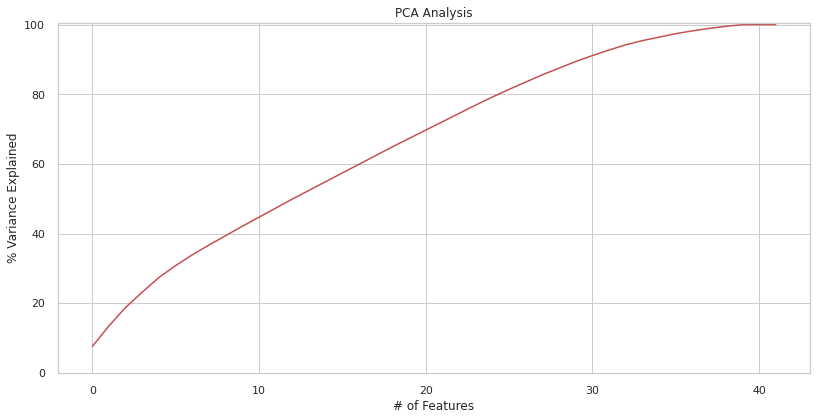

In [ ]:
#K-Means Part 2- PCA
variance = pca.explained_variance_ratio_ 
var=np.cumsum(np.round(variance, 3)*100)
plt.figure(figsize=(12,6))
plt.ylabel('% Variance Explained')
plt.xlabel('# of Features')
plt.title('PCA Analysis')
plt.ylim(0,100.5)
plt.plot(var, color='r')

25 features appears to be optimal.

In [ ]:
#K-Means Part 2- PCA 
pca = PCA(n_components = 20)

In [ ]:
#K-Means Part 2- PCA Fit
pca.fit(X_scaled)

PCA(n_components=20)

In [ ]:
#K-Means Part 2- PCA Transform
pca.transform(X_scaled)

array([[ 0.17695295, -0.46924169,  1.12988948, ...,  0.04435403,
         0.19778302, -0.21082305],
       [ 0.58978989, -1.31632087, -1.75133923, ...,  0.26271476,
        -0.0407575 , -0.05852173],
       [-0.47435511,  0.25688743,  0.36166936, ...,  0.70951952,
         0.69590898,  0.12295312],
       ...,
       [-3.97445253, -0.66584013, -1.11785247, ...,  0.74897535,
         0.14922094,  0.56477522],
       [-0.7576988 ,  0.85786386,  0.41978866, ...,  0.13381913,
         0.26473792, -0.02830741],
       [ 1.797788  , -0.31585562,  0.3063098 , ...,  0.24351938,
         0.21802019,  0.63152751]])

In [ ]:
#K-Means Part 2- Define Scores 
scores_pca = pca.transform(X_scaled)

In [ ]:
#K-Means Part 2- PCA Fitting
WCSS = []
for i in range(1, 21): 
  kmeans_pca = KMeans(n_clusters = i, init = 'k-means++', random_state=42)
  kmeans_pca.fit(scores_pca)
  WCSS.append(kmeans_pca.inertia_)

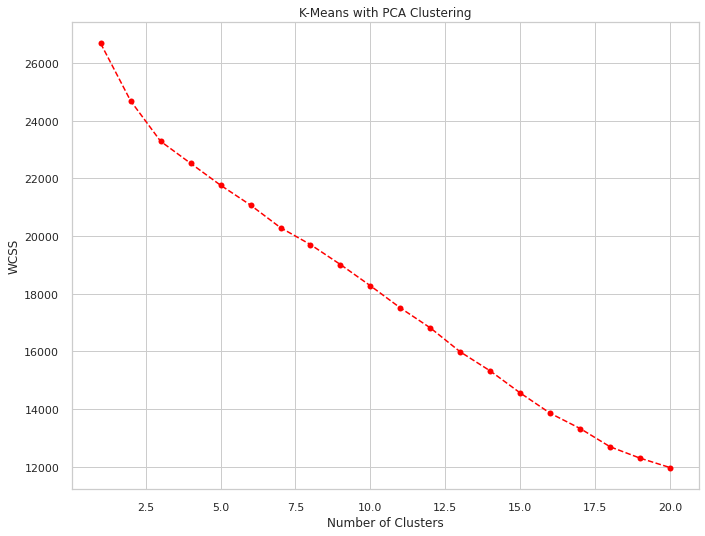

In [ ]:
#K-Means Part 2 - Plot Graph Against WCSS 
plt.figure(figsize=(10,8))
plt.plot(range(1,21), WCSS, marker = 'o', linestyle = '--', color='red')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.title('K-Means with PCA Clustering')
plt.show()

This elbow plot tells us that for K-Means, after applying PCA, our optimal cluster size is roughly 16 or 18. The dip in this plot is not clear, so there may not be a significant difference when in using 16 compared to 18 clusters. For consistency, we will use 18 to better compare the results of applying PCA to K-Means. 

In [ ]:
#K-Means Part 2 - PCA Implementation
kmeans_pca = KMeans(n_clusters=20, init = 'k-means++', random_state=42)
kmeans_pca.fit(scores_pca)

KMeans(n_clusters=20, random_state=42)

In [ ]:
#K-Means Part 2 - PCA - Create New DF with Clusters
kmeans_df = pd.concat([movies6.reset_index(drop=True), pd.DataFrame(scores_pca)], axis=1)
kmeans_df.columns.values[-20: ] = ['PC 1','PC 2','PC 3','PC 4','PC 5','PC 6',
                                  'PC 7','PC 8','PC 9','PC 10','PC 11','PC 12',
                                  'PC 13','PC 14','PC 15','PC 16','PC 17','PC 18','PC 19','PC 20']
kmeans_df['K-Means PCA Labels'] = kmeans_pca.labels_


In [ ]:
#K-Means Part 2 - PCA - Create New Column Mapping Clusters 
kmeans_df['Rooms'] = kmeans_df['K-Means PCA Labels'].map({0: 'Room 1',
1: 'Room 2',12: 'Room 3',3: 'Room 4',4: 'Room 5',5: 'Room 6', 6: 'Room 7',
7: 'Room 8',8: 'Room 9',9: 'Room 10',10: 'Room 11',11: 'Room 12',12: 'Room 13',
13: 'Room 14',14: 'Room 15',15: 'Room 16',16: 'Room 17', 17: 'Room 18',18: 'Room',
19: 'Room 19'})                                          

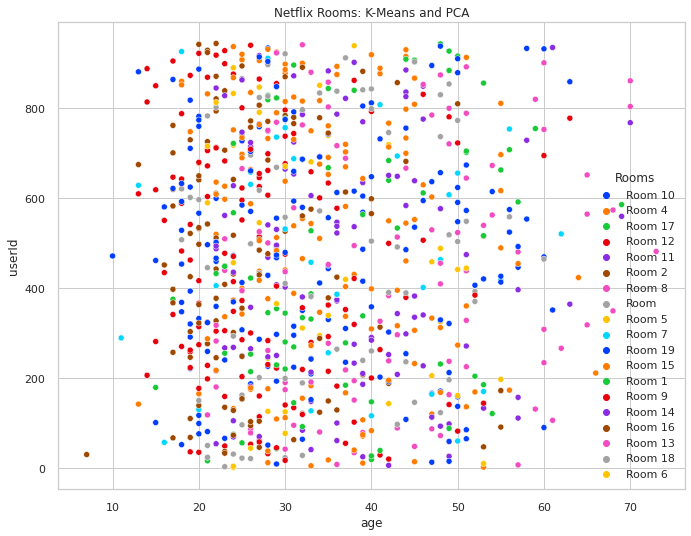

In [ ]:
#K-Means Part 2 - PCA - Plotting Results
x_axis = kmeans_df['age']
y_axis = kmeans_df['userId']

plt.figure(figsize=(10, 8))
sns.scatterplot(x_axis, y_axis, hue=kmeans_df['Rooms'], palette="bright")
plt.title("Netflix Rooms: K-Means and PCA")

plt.show()

In [ ]:
#K-Means Part 2 - Define X and y_pred 
X = pd.DataFrame(data=kmeans_df)
X.drop(columns='userId', inplace=True)

y_pred = kmeans_df['userId']

This is our resulting scatterplot from applying PCA to our original model. We can tell by looking at this graph that although the clusters are far from defined, they do start to provide some insights. For instance, userID and age appears to be correlated to the rooms the algorithm assigned to our users. Below, we will implement T-SNE to hopefully better define the clusters. 

In [ ]:
#K-Means Part 3 - T-SNE 
from sklearn.manifold import TSNE

tsne = TSNE(verbose=1, perplexity=50) 
X_embedded = tsne.fit_transform(X_scaled.to_numpy())

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 943 samples in 0.000s...
[t-SNE] Computed neighbors for 943 samples in 0.050s...
[t-SNE] Computed conditional probabilities for sample 943 / 943
[t-SNE] Mean sigma: 2.631890
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.401810
[t-SNE] KL divergence after 1000 iterations: 0.598605


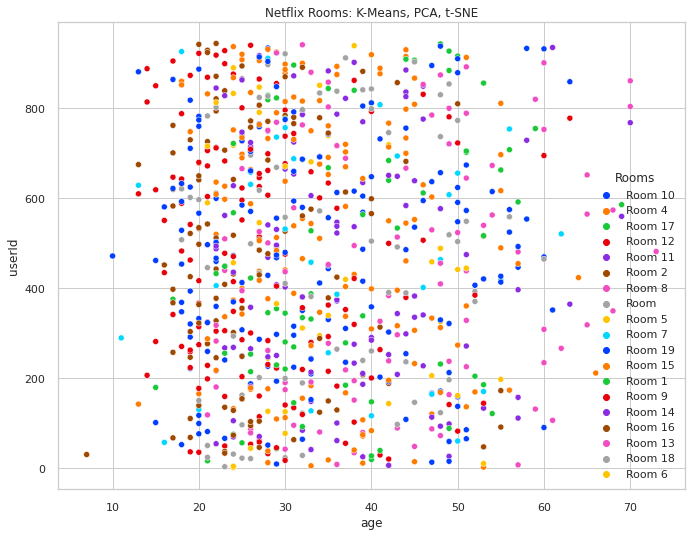

In [ ]:
#K-Means Part 3 - T-SNE 
plt.figure(figsize=(10, 8))
sns.scatterplot(x_axis, y_axis, hue=kmeans_df['Rooms'], palette="bright")
plt.title("Netflix Rooms: K-Means, PCA, t-SNE")

plt.show()

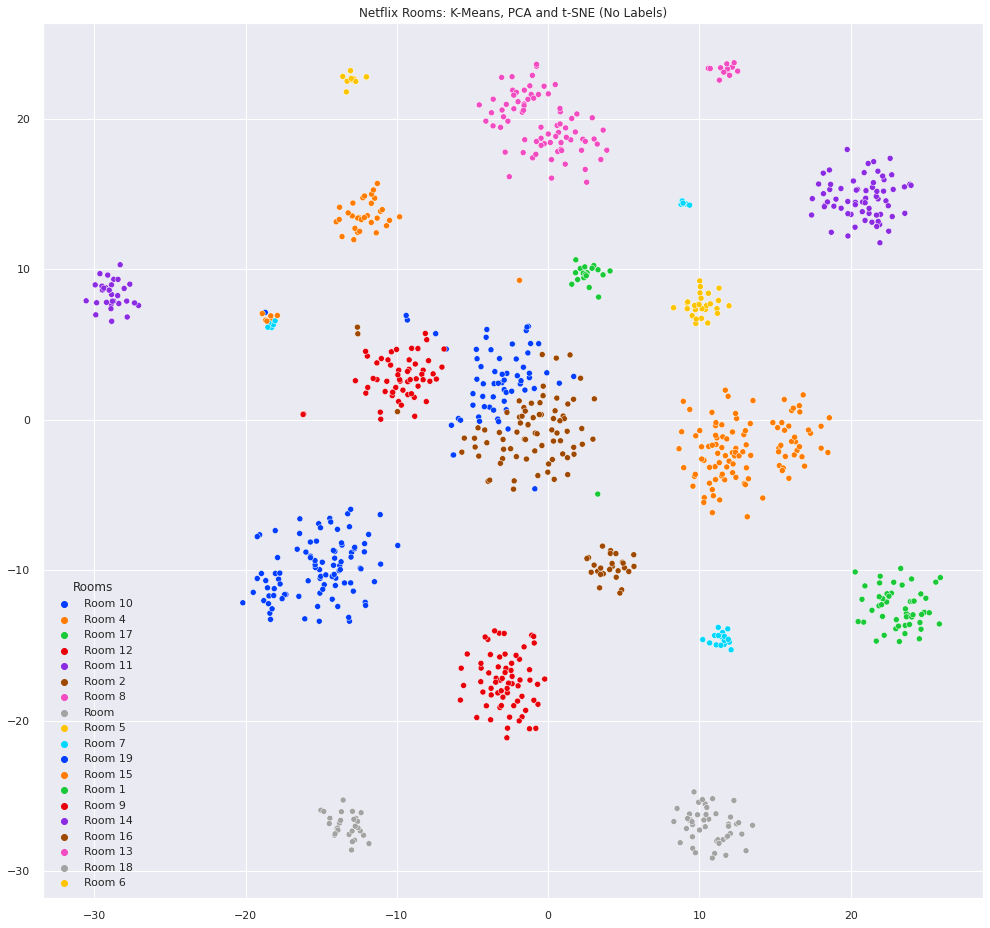

In [ ]:
#K-Means Part 3 - T-SNE 
sns.set(rc={'figure.figsize':(15,15)})

# colors
palette = sns.color_palette("bright", 1)

# plot
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], hue=kmeans_df['Rooms'],
                palette="bright")
plt.title('Netflix Rooms: K-Means, PCA and t-SNE (No Labels)')
plt.savefig("netflixrooms.png")
plt.show()

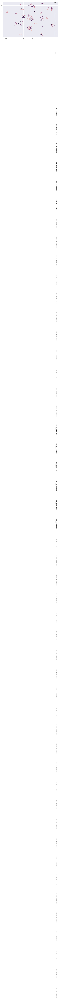

In [ ]:
#K-Means Part 3 - T-SNE 
sns.set(rc={'figure.figsize':(13,9)})

# colors
palette = sns.hls_palette(20, l=.4, s=.9)

# plot
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], hue=y_pred, legend='full')
plt.title('t-SNE with Kmeans Labels')
plt.savefig("improved_cluster_tsne.png")
plt.show()

In [ ]:
#Cluster Analysis - Decision Tree 
def acc(y_true, y_pred):
    """
        Calculates the accuracy score between labels and predictions.
    """
    return round(accuracy_score(y_true, y_pred) * 100, 2)

In [ ]:
#Cluster Analysis - Decision Tree 
kmeans_df.dropna(inplace=True)
features = [col for col in kmeans_df.columns if col.startswith('PC')]

In [ ]:
#Cluster Analysis - Decision Tree 
#Split up the t-SNE results in training and testing data
tsvd = TruncatedSVD(n_components=19).fit_transform(kmeans_df[features])
tsne = TSNE(n_components=19, method='exact')
transformed = tsne.fit_transform(tsvd)

tsne_train = pd.DataFrame(transformed[:len(kmeans_df)])

tsne_test = pd.DataFrame(transformed[len(kmeans_df):])

In [ ]:
#Cluster Analysis - t-SNE Decision Tree Split Test and Training Sets
X_train, X_val, y_train, y_val = train_test_split(tsne_train, 
                                                  kmeans_df['Rooms'], 
                                                  test_size=0.25, 
                                                  random_state=42)
#Drop NaN Values 
y_train.dropna(inplace=True)

In [ ]:
#Cluster Analysis - Decision Tree 
print(X_train.shape)
print(y_train.shape)

(695, 19)
(695,)


In [ ]:
#Cluster Analysis - Decision Tree 
#Train Model with t-SNE Features
clf = DecisionTreeClassifier(max_depth=3, random_state=42)
clf.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=3, random_state=42)

In [ ]:
#Cluster Analysis - Decision Tree 
train_preds = clf.predict(X_train)
val_preds = clf.predict(X_val)
acc_tsne_train = acc(train_preds, y_train)
acc_tsne_val = acc(val_preds, y_val)
print(f'Training accuracy with t-SNE features: {acc_tsne_train}%')
print(f'Validation accuracy with t-SNE features: {acc_tsne_val}%')

Training accuracy with t-SNE features: 36.4%
Validation accuracy with t-SNE features: 31.03%


In [ ]:
#Cluster Analysis - Decision Tree Text Representation
from sklearn import tree
text_representation = tree.export_text(clf)
print(text_representation)

|--- feature_12 <= -0.22
|   |--- feature_13 <= -0.35
|   |   |--- feature_12 <= -2.79
|   |   |   |--- class: Room 4
|   |   |--- feature_12 >  -2.79
|   |   |   |--- class: Room 4
|   |--- feature_13 >  -0.35
|   |   |--- feature_5 <= -0.83
|   |   |   |--- class: Room 19
|   |   |--- feature_5 >  -0.83
|   |   |   |--- class: Room 14
|--- feature_12 >  -0.22
|   |--- feature_16 <= -2.17
|   |   |--- feature_0 <= -0.14
|   |   |   |--- class: Room 8
|   |   |--- feature_0 >  -0.14
|   |   |   |--- class: Room 11
|   |--- feature_16 >  -2.17
|   |   |--- feature_1 <= 0.83
|   |   |   |--- class: Room 17
|   |   |--- feature_1 >  0.83
|   |   |   |--- class: Room 2



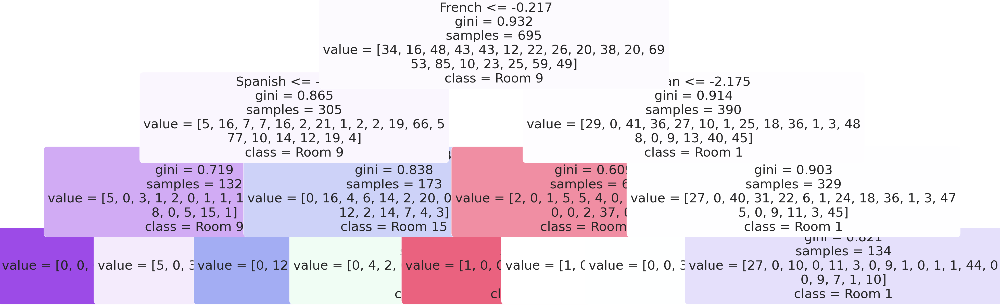

In [ ]:
#Cluster Analysis - Decision Tree Visualization
feature_names = kmeans_df.columns[:20]
feature_names = kmeans_df.drop(['Rooms'], axis=1).columns

target_names = kmeans_df['Rooms'].unique().tolist()

plt.figure(figsize=(50,20))

tree.plot_tree(clf, 
          feature_names = feature_names, 
          class_names = target_names, 
          filled = True, 
          rounded = True,
          fontsize = 50)

plt.savefig('tree_visualization.png') 

In [ ]:
#Cluster Analysis - Decision Tree Visualization
feature_names = kmeans_df.columns[:20]
feature_names = kmeans_df.drop(['Rooms'], axis=1).columns

target_names = kmeans_df['Rooms'].unique().tolist()

plt.figure(figsize=(100,250))

tree.plot_tree(clf, 
          feature_names = feature_names, 
          class_names = target_names, 
          filled = True, 
          rounded = True,
          fontsize = 100)

plt.savefig('tree_visualization.png') 

We applied PCA to the dataset on the second try with DBSCAN to hopefully obtain more precise results. Because our data has a high number of features, PCA will help us establish what is most important and what is not. It is ideal if we reach at least 80% variance to avoid overfitting. According to the plot above, including roughly 25 features gets us there.

Explained variance allows us to understand which features are affecting the PCA plot.

The first step is to determine the optimal number of features for clustering.

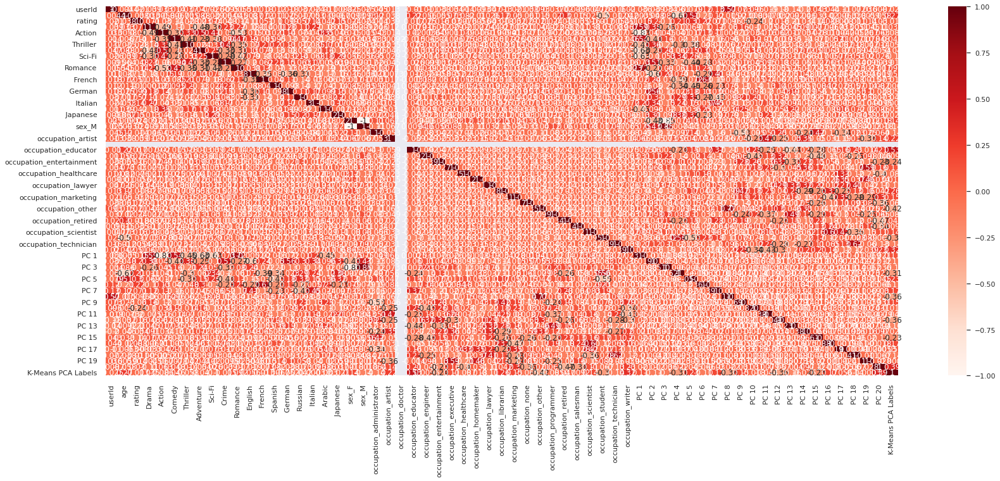

In [ ]:
#Cluster Interpretation
plt.figure(figsize=(25,10))
cor = kmeans_df.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)

plt.show()

In [ ]:
#Cluster Interpretation
kmeans_df.sort_values(by=['Rooms'])
kmeans_df.describe()

,userId,age,rating,Drama,Action,Comedy,Thriller,Adventure,Sci-Fi,Crime,Romance,English,French,Spanish,German,Russian,Italian,Arabic,Japanese,sex_F,sex_M,occupation_administrator,occupation_artist,occupation_doctor,occupation_educator,occupation_engineer,occupation_entertainment,occupation_executive,occupation_healthcare,occupation_homemaker,occupation_lawyer,occupation_librarian,occupation_marketing,occupation_none,occupation_other,occupation_programmer,occupation_retired,occupation_salesman,occupation_scientist,occupation_student,occupation_technician,occupation_writer,PC 1,PC 2,PC 3,PC 4,PC 5,PC 6,PC 7,PC 8,PC 9,PC 10,PC 11,PC 12,PC 13,PC 14,PC 15,PC 16,PC 17,PC 18,PC 19,PC 20,K-Means PCA Labels
count,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.0,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000
mean,472.030205,34.020496,3.700212,0.155383,0.126403,0.116203,0.108045,0.089207,0.076279,0.067654,0.073506,0.507444,0.090441,0.066115,0.041568,0.025786,0.029363,0.015799,0.012054,0.292341,0.707659,0.083064,0.030205,0.0,0.100324,0.071197,0.019417,0.034520,0.017260,0.007551,0.012945,0.055016,0.028047,0.009709,0.113269,0.071197,0.015102,0.012945,0.033441,0.207120,0.029126,0.048544,-0.044682,-0.019811,-0.007014,-0.004739,-0.023541,-0.036051,-0.025915,0.004087,-0.000739,0.004624,0.004112,-0.017558,-0.000967,0.022593,-0.028688,0.000531,0.004643,-0.013622,-0.007455,-0.031649,9.785329
std,272.829584,12.192508,0.503505,0.068713,0.052013,0.062212,0.048491,0.041519,0.045455,0.037420,0.049706,0.103147,0.041245,0.035719,0.027025,0.025305,0.025255,0.019358,0.016677,0.455084,0.455084,0.276127,0.171243,0.0,0.300593,0.257293,0.138062,0.182659,0.130309,0.086616,0.113098,0.228135,0.165198,0.098106,0.317092,0.257293,0.122026,0.113098,0.179883,0.405461,0.168251,0.215028,1.749862,1.566155,1.491046,1.359715,1.321662,1.161488,1.112975,1.092762,1.067155,1.063168,1.057174,1.035897,1.045404,1.013675,0.995658,1.034081,1.029494,1.013486,1.021096,0.937630,5.787292
min,1.000000,7.000000,1.857143,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-5.720570,-7.015685,-4.211743,-4.357420,-4.221236,-4.167032,-7.001556,-2.370540,-4.036470,-3.317685,-3.207004,-2.725634,-3.825405,-2.138800,-2.936108,-3.348373,-1.783687,-2.315921,-2.685964,-3.921544,0.000000
25%,234.500000,25.000000,3.376689,0.111111,0.093750,0.077115,0.078431,0.063830,0.047619,0.043637,0.041667,0.448276,0.068660,0.046998,0.027027,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.160015,-0.942765,-1.390497,-0.900655,-0.870450,-0.749897,-0.737106,-0.733647,-0.610487,-0.547950,-0.592559,-0.627338,-0.598677,-0.695994,-0.848508,-0.487204,-0.688925,-0.513362,-0.298463,-0.205283,5.000000
50%,474.000000,31.000000,3.700000,0.146707,0.127451,0.107527,0.107143,0.086957,0.071429,0.065600,0.063636,0.500000,0.089631,0.065041,0.041494,0.025641,0.027027,0.014620,0.005848,0.000000,1.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000

In [ ]:
#Cluster Interpretation - Room 13
room13 = kmeans_df.loc[kmeans_df['Rooms'] == 'Room 1']
room13.describe()

,userId,age,rating,Drama,Action,Comedy,Thriller,Adventure,Sci-Fi,Crime,Romance,English,French,Spanish,German,Russian,Italian,Arabic,Japanese,sex_F,sex_M,occupation_administrator,occupation_artist,occupation_doctor,occupation_educator,occupation_engineer,occupation_entertainment,occupation_executive,occupation_healthcare,occupation_homemaker,occupation_lawyer,occupation_librarian,occupation_marketing,occupation_none,occupation_other,occupation_programmer,occupation_retired,occupation_salesman,occupation_scientist,occupation_student,occupation_technician,occupation_writer,PC 1,PC 2,PC 3,PC 4,PC 5,PC 6,PC 7,PC 8,PC 9,PC 10,PC 11,PC 12,PC 13,PC 14,PC 15,PC 16,PC 17,PC 18,PC 19,PC 20,K-Means PCA Labels
count,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.0
mean,398.000000,29.222222,3.755704,0.149373,0.144682,0.098358,0.109085,0.118270,0.086156,0.058852,0.067904,0.464809,0.075803,0.055985,0.037602,0.043892,0.026610,0.016688,0.011288,0.111111,0.888889,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.990081,0.449943,1.024819,1.103094,0.694695,-0.062354,-1.669340,-1.016038,2.104994,1.969202,-0.264948,2.696040,-2.456769,1.656824,1.039367,0.413622,-0.967001,-0.517595,-0.977099,-1.581081,0.0
std,295.854098,10.056052,0.613804,0.076415,0.066367,0.049810,0.050778,0.040937,0.083386,0.040352,0.053696,0.136889,0.050593,0.037824,0.027682,0.058779,0.031948,0.019907,0.018832,0.323381,0.323381,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.975114,1.001309,1.128207,1.448546,1.489265,1.407656,1.645440,0.656252,0.657629,0.873563,0.420239,0.435083,0.609470,0.423177,0.278165,0.252000,0.304561,0.198127,0.254777,0.290537,0.0
min,16.000000,15.000000,2.083333,0.000000,0.000000,0.000000,0.000000,0.064000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-4.465983,-1.535568,-2.196976,-1.390628,-0.569690,-3.445625,-7.001556,-2.104634,1.340089,0.976927,-1.077380,1.881266,-3.825405,1.023877,0.634279,0.104377,-1.562595,-0.919144,-1.253618,-2.091187,0.0
25%,153.500000,23.000000,3.485507,0.100666,0.094216,0.074507,0.088153,0.087276,0.027623,0.027846,0.031902,0.465227,0.035281,0.033854,0.014677,0.016532,0.000000,0.000000,0.000000,0.000000,1.000000,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.241691,0.097119,0.775134,0.337809,-0.186608,-0.632766,-1.858693,-1.436125,1.767963,1.489214,-0.409384,2.499924,-2.761399,1.383677,0.895369,0.210454,-1.188179,-0.609756,-1.154073,-1.772892,0.0
50%,381.000000,25.000000,3.898810,0.147854,0.162162,0.090909,0.127556,0.101698,0.074173,0.066698,0.055117,0.484681,0.077647,0.062267,0.040833,0.027751,0.019113,0.008475,0.000000,0.000000,1.000000,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.919151,0.685096,1.138958,0.878134,0.044500,-0.171131,-1.722432,-0.975104,2.016193,1.791553,-0.290883,2.714630,-2.397372,1.515605,1.007119,0.417463,-0.988150,-0.497849,-1.001996,-1.578150,0.0
75%,537.250000,33.000000,4.164101,0.184506,0.174967,0.107244,0.141335,0.145765,0.114165,0.077507,0.108533,0.515938,0.109929,0.084912,0.050636,0.041914,0.036840,0.030518,0.016017,0.000000,1.000000,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.158376,1.076577,1.549463,2.076023,1.441191,0.998944,-0.894923,-0.721901,2.323012,1.991192,-0.107438,3.103386,-2.091833,1

In [ ]:
#Cluster Interpretation - Room 14
room14 = kmeans_df.loc[kmeans_df['Rooms'] == 'Room 14']
room14.head()

,userId,age,rating,Drama,Action,Comedy,Thriller,Adventure,Sci-Fi,Crime,Romance,English,French,Spanish,German,Russian,Italian,Arabic,Japanese,sex_F,sex_M,occupation_administrator,occupation_artist,occupation_doctor,occupation_educator,occupation_engineer,occupation_entertainment,occupation_executive,occupation_healthcare,occupation_homemaker,occupation_lawyer,occupation_librarian,occupation_marketing,occupation_none,occupation_other,occupation_programmer,occupation_retired,occupation_salesman,occupation_scientist,occupation_student,occupation_technician,occupation_writer,PC 1,PC 2,PC 3,PC 4,PC 5,PC 6,PC 7,PC 8,PC 9,PC 10,PC 11,PC 12,PC 13,PC 14,PC 15,PC 16,PC 17,PC 18,PC 19,PC 20,K-Means PCA Labels,Rooms
33,265,26,3.767442,0.118056,0.173611,0.090278,0.076389,0.138889,0.069444,0.055556,0.090278,0.525641,0.115385,0.064103,0.076923,0.000000,0.012821,0.025641,0.012821,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-1.085760,0.311912,1.619673,-0.596683,-0.003147,1.228284,-0.085254,-1.181834,-0.684783,0.935436,1.149152,-1.520665,0.585151,2.116940,0.921539,-0.696220,0.142854,-0.875508,3.218384,0.844632,13,Room 14
41,357,26,2.991319,0.166259,0.119804,0.102689,0.124694,0.083130,0.084352,0.053790,0.080685,0.454874,0.074007,0.064982,0.034296,0.028881,0.025271,0.018051,0.030686,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-0.210474,0.692916,1.144516,0.053673,-0.228189,-0.697614,-0.755759,-0.965327,0.031368,0.925562,1.982365,-1.716368,0.542078,1.988950,0.928905,-0.705575,0.205178,-0.797227,3.144998,0.821115,13,Room 14
56,474,51,4.720000,0.108434,0.108434,0.120482,0.132530,0.084337,0.060241,0.048193,0.084337,0.534884,0.116279,0.093023,0.046512,0.000000,0.000000,0.023256,0.000000,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-0.194714,0.013855,1.414660,-1.983146,0.006484,0.656030,-0.248593,-0.794097,-0.414522,0.309542,0.770487,-1.595542,-0.160061,1.785523,0.558349,-0.407455,0.039602,-0.797832,3.132695,0.971453,13,Room 14
81,653,31,3.793831,0.134160,0.113867,0.112740,0.076663,0.113867,0.101466,0.033822,0.071026,0.507909,0.089631,0.045694,0.047452,0.038664,0.026362,0.014060,0.012302,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-0.375316,0.105785,1.639624,0.242196,0.788519,0.246721,-0.315669,-0.381026,-0.080183,1.112743,1.323735,-1.712769,-0.018545,1.740747,0.931741,-0.549187,-0.028123,-0.990513,3.324514,0.731894,13,Room 14
108,901,38,3.380107,0.139130,0.155901,0.100621,0.106832,0.097516,0.087578,0.073913,0.033540,0.453654,0.066845,0.077540,0.044563,0.039216,0.028520,0.017825,0.027629,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-1.108630,0.994184,1.021658,-0.385629,0.086170,-0.859007,-0.304334,0.133833,-0.015935,1.147900,1.682284,-1.873142,0.155788,1.412985,1.022003,-0.425645,0.019714,-1.075485,3.273257,0.884581,13,Room 14


In [ ]:
#Cluster Interpretation - Room 2
pd.set_option('display.max_columns', None)
room2 = kmeans_df.loc[kmeans_df['Rooms'] == 'Room 13']
room13.describe()

,userId,age,rating,Drama,Action,Comedy,Thriller,Adventure,Sci-Fi,Crime,Romance,English,French,Spanish,German,Russian,Italian,Arabic,Japanese,sex_F,sex_M,occupation_administrator,occupation_artist,occupation_doctor,occupation_educator,occupation_engineer,occupation_entertainment,occupation_executive,occupation_healthcare,occupation_homemaker,occupation_lawyer,occupation_librarian,occupation_marketing,occupation_none,occupation_other,occupation_programmer,occupation_retired,occupation_salesman,occupation_scientist,occupation_student,occupation_technician,occupation_writer,PC 1,PC 2,PC 3,PC 4,PC 5,PC 6,PC 7,PC 8,PC 9,PC 10,PC 11,PC 12,PC 13,PC 14,PC 15,PC 16,PC 17,PC 18,PC 19,PC 20,K-Means PCA Labels
count,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.0
mean,398.000000,29.222222,3.755704,0.149373,0.144682,0.098358,0.109085,0.118270,0.086156,0.058852,0.067904,0.464809,0.075803,0.055985,0.037602,0.043892,0.026610,0.016688,0.011288,0.111111,0.888889,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.990081,0.449943,1.024819,1.103094,0.694695,-0.062354,-1.669340,-1.016038,2.104994,1.969202,-0.264948,2.696040,-2.456769,1.656824,1.039367,0.413622,-0.967001,-0.517595,-0.977099,-1.581081,0.0
std,295.854098,10.056052,0.613804,0.076415,0.066367,0.049810,0.050778,0.040937,0.083386,0.040352,0.053696,0.136889,0.050593,0.037824,0.027682,0.058779,0.031948,0.019907,0.018832,0.323381,0.323381,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.975114,1.001309,1.128207,1.448546,1.489265,1.407656,1.645440,0.656252,0.657629,0.873563,0.420239,0.435083,0.609470,0.423177,0.278165,0.252000,0.304561,0.198127,0.254777,0.290537,0.0
min,16.000000,15.000000,2.083333,0.000000,0.000000,0.000000,0.000000,0.064000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-4.465983,-1.535568,-2.196976,-1.390628,-0.569690,-3.445625,-7.001556,-2.104634,1.340089,0.976927,-1.077380,1.881266,-3.825405,1.023877,0.634279,0.104377,-1.562595,-0.919144,-1.253618,-2.091187,0.0
25%,153.500000,23.000000,3.485507,0.100666,0.094216,0.074507,0.088153,0.087276,0.027623,0.027846,0.031902,0.465227,0.035281,0.033854,0.014677,0.016532,0.000000,0.000000,0.000000,0.000000,1.000000,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.241691,0.097119,0.775134,0.337809,-0.186608,-0.632766,-1.858693,-1.436125,1.767963,1.489214,-0.409384,2.499924,-2.761399,1.383677,0.895369,0.210454,-1.188179,-0.609756,-1.154073,-1.772892,0.0
50%,381.000000,25.000000,3.898810,0.147854,0.162162,0.090909,0.127556,0.101698,0.074173,0.066698,0.055117,0.484681,0.077647,0.062267,0.040833,0.027751,0.019113,0.008475,0.000000,0.000000,1.000000,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.919151,0.685096,1.138958,0.878134,0.044500,-0.171131,-1.722432,-0.975104,2.016193,1.791553,-0.290883,2.714630,-2.397372,1.515605,1.007119,0.417463,-0.988150,-0.497849,-1.001996,-1.578150,0.0
75%,537.250000,33.000000,4.164101,0.184506,0.174967,0.107244,0.141335,0.145765,0.114165,0.077507,0.108533,0.515938,0.109929,0.084912,0.050636,0.041914,0.036840,0.030518,0.016017,0.000000,1.000000,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.158376,1.076577,1.549463,2.076023,1.441191,0.998944,-0.894923,-0.721901,2.323012,1.991192,-0.107438,3.103386,-2.091833,1

Young, skews heavily male, 24 years old on average (youngest cluster), likes drama, comedy, with romance not far behind, mostly students (80%), with engineering being the most represented career
-engineer
-stem students 

In [ ]:
columns_list = ['sex_M', 'sex_F']
room13['(sex_M + sex_F)'] = room13[columns_list].sum(axis=1)
room13.head(1)

,userId,age,rating,Drama,Action,Comedy,Thriller,Adventure,Sci-Fi,Crime,Romance,English,French,Spanish,German,Russian,Italian,Arabic,Japanese,sex_F,sex_M,occupation_administrator,occupation_artist,occupation_doctor,occupation_educator,occupation_engineer,occupation_entertainment,occupation_executive,occupation_healthcare,occupation_homemaker,occupation_lawyer,occupation_librarian,occupation_marketing,occupation_none,occupation_other,occupation_programmer,occupation_retired,occupation_salesman,occupation_scientist,occupation_student,occupation_technician,occupation_writer,PC 1,PC 2,PC 3,PC 4,PC 5,PC 6,PC 7,PC 8,PC 9,PC 10,PC 11,PC 12,PC 13,PC 14,PC 15,PC 16,PC 17,PC 18,PC 19,PC 20,K-Means PCA Labels,Rooms,(sex_M + sex_F)
20,179,15,3.608696,0.271186,0.067797,0.101695,0.135593,0.084746,0.016949,0.067797,0.118644,0.5,0.175,0.05,0.05,0.025,0.025,0.0,0.0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.718573,1.335314,0.72848,0.324707,-0.56969,1.343421,-1.740131,-1.746081,1.835868,1.993416,-0.30161,2.611206,-2.403277,2.3327,1.043446,0.304346,-1.254956,-0.38445,-1.001703,-2.013411,0,Room 1,1


In [ ]:
#Cluster Interpretation - Random Forest
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score

clf = RandomForestClassifier()

cv_results = cross_val_score(clf,X_train, y_train, scoring="accuracy")

cv_results.mean()

clf.fit(X_train,y_train)

clf(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

indices = np.argsort(clf.feature_importances_)[::-1][:40]

fig = plt.figure(figsize=(7, 10))
g = sns.barplot(y=feature_names[indices][:40],x = clf.feature_importances_[indices][:40] , orient='h')
g.set_xlabel("Relative importance",fontsize=12)
g.set_ylabel("Features",fontsize=12)
g.tick_params(labelsize=9)
g.set_title("Random Forest classifier feature importance")

plt.show()
plt.gcf().clear()

TypeError: ignored